In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import confusion_matrix, classification_report,roc_curve,roc_auc_score,ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier

In [2]:
df=pd.read_csv("C:/Users/Administrator/Downloads/heart.csv")
df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,52,1,0,125,212,0,1,168,0,1.0,2,2,3,0
1,53,1,0,140,203,1,0,155,1,3.1,0,0,3,0
2,70,1,0,145,174,0,1,125,1,2.6,0,0,3,0
3,61,1,0,148,203,0,1,161,0,0.0,2,1,3,0
4,62,0,0,138,294,1,1,106,0,1.9,1,3,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1020,59,1,1,140,221,0,1,164,1,0.0,2,0,2,1
1021,60,1,0,125,258,0,0,141,1,2.8,1,1,3,0
1022,47,1,0,110,275,0,0,118,1,1.0,1,1,2,0
1023,50,0,0,110,254,0,0,159,0,0.0,2,0,2,1


In [3]:
df.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,1025.000000,1025.000000,1025.000000,1025.000000,1025.00000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000
mean,54.434146,0.695610,0.942439,131.611707,246.00000,0.149268,0.529756,149.114146,0.336585,1.071512,1.385366,0.754146,2.323902,0.513171
std,9.072290,0.460373,1.029641,17.516718,51.59251,0.356527,0.527878,23.005724,0.472772,1.175053,0.617755,1.030798,0.620660,0.500070
min,29.000000,0.000000,0.000000,94.000000,126.00000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,48.000000,0.000000,0.000000,120.000000,211.00000,0.000000,0.000000,132.000000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,56.000000,1.000000,1.000000,130.000000,240.00000,0.000000,1.000000,152.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,275.00000,0.000000,1.000000,166.000000,1.000000,1.800000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.00000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


In [4]:
df.isnull().sum()   

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
target      0
dtype: int64

In [5]:
X=df.drop("target", axis=1)
y=df["target"]

In [43]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [21]:
pipeline=Pipeline(
    steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", MinMaxScaler()),
    ("classifier", DecisionTreeClassifier(random_state=42))
    ]
)
pipeline

Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                ('scaler', MinMaxScaler()),
                ('classifier', DecisionTreeClassifier(random_state=42))])

In [22]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                ('scaler', MinMaxScaler()),
                ('classifier', DecisionTreeClassifier(random_state=42))])

In [23]:
y_pred = pipeline.predict(X_test)
y_pred

array([1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1,
       0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0,
       1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1,
       1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0,
       1, 1, 1, 1, 1, 0, 0], dtype=int64)

In [24]:
y_prob= pipeline.predict_proba(X_test)[:, 1]
y_prob

array([1., 1., 0., 1., 0., 1., 0., 0., 1., 0., 1., 0., 1., 1., 0., 0., 0.,
       1., 1., 0., 0., 0., 0., 0., 0., 1., 1., 1., 0., 0., 0., 1., 0., 1.,
       1., 1., 0., 1., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1.,
       0., 0., 0., 1., 1., 0., 0., 0., 1., 1., 1., 0., 1., 0., 0., 1., 0.,
       0., 1., 0., 0., 0., 1., 1., 1., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 1., 0., 0., 0., 0., 0., 1., 1., 1., 1., 0., 0., 0., 0., 1., 0.,
       0., 1., 0., 1., 0., 1., 0., 1., 0., 1., 1., 0., 1., 1., 0., 1., 1.,
       0., 1., 1., 0., 0., 1., 0., 1., 0., 0., 1., 1., 0., 1., 1., 0., 1.,
       0., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 1.,
       1., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0., 1., 1., 0., 0., 1., 1.,
       0., 1., 1., 0., 1., 1., 1., 0., 0., 1., 1., 0., 1., 0., 1., 1., 1.,
       0., 1., 1., 1., 0., 0., 0., 0., 1., 0., 0., 1., 1., 1., 1., 1., 0.,
       0.])

In [25]:
#Evaluate the model
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print('\n')
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[102   0]
 [  3 100]]



Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99       102
           1       1.00      0.97      0.99       103

    accuracy                           0.99       205
   macro avg       0.99      0.99      0.99       205
weighted avg       0.99      0.99      0.99       205



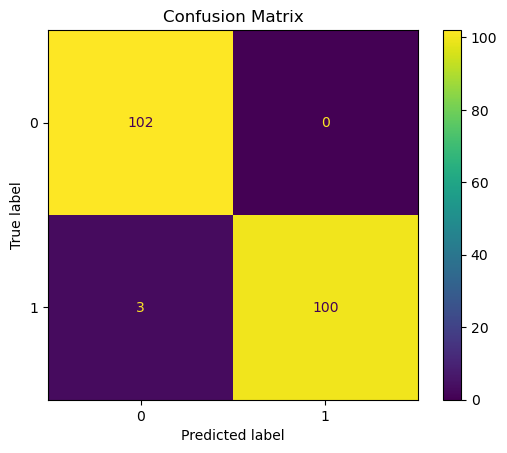

In [26]:
ConfusionMatrixDisplay.from_estimator(pipeline,X_test, y_test)
plt.title("Confusion Matrix")
plt.show()

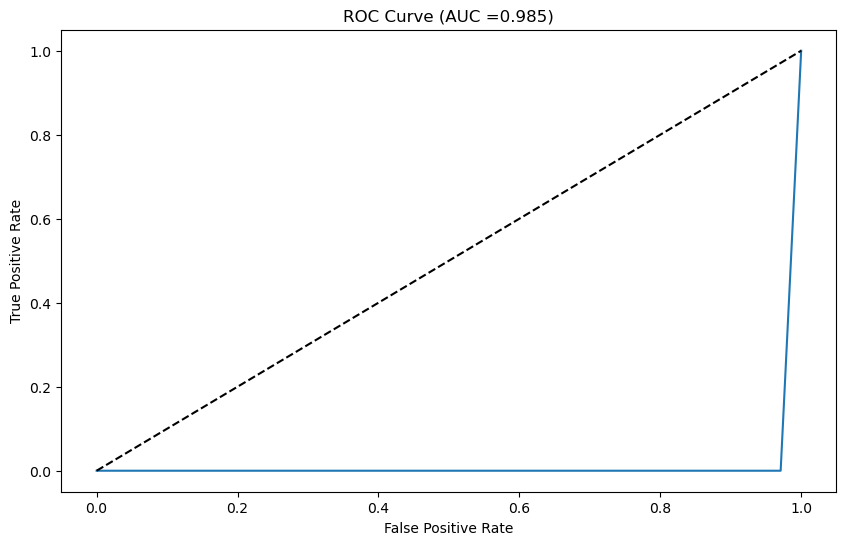

In [27]:
auc=roc_auc_score(y_test, y_prob)
tpr,fpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f"AUC = {auc:.2f}")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title(f"ROC Curve (AUC ={auc:.3f})")
plt.show()

In [28]:
auc

0.9854368932038835

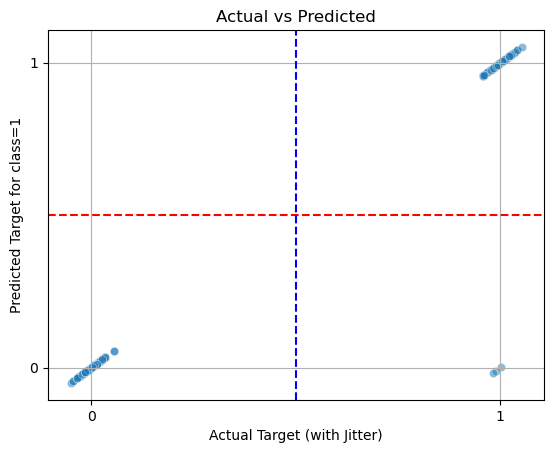

In [32]:
jitter=np.random.normal(0, 0.02, size=len(y_test))
sns.scatterplot(x=y_test + jitter, y=y_pred + jitter, alpha=0.5)
plt.title("Actual vs Predicted")
plt.xlabel("Actual Target (with Jitter)")
plt.ylabel("Predicted Target for class=1")
plt.axhline(0.5, color='red', linestyle='--')
plt.axvline(0.5, color='blue', linestyle='--')
plt.xticks(np.arange(0, 2, 1))
plt.yticks(np.arange(0, 2, 1))
plt.grid()
plt.show()

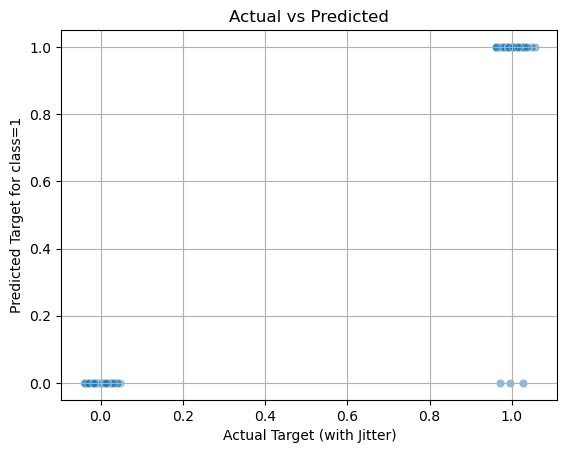

In [33]:
jitter=np.random.normal(0, 0.02, size=len(y_test))
sns.scatterplot(x=y_test + jitter, y=y_prob, alpha=0.5)
plt.title("Actual vs Predicted")
plt.xlabel("Actual Target (with Jitter)")
plt.ylabel("Predicted Target for class=1")
'''plt.axhline(0.5, color='red', linestyle='--')
plt.axvline(0.5, color='blue', linestyle='--')
plt.xticks(np.arange(0, 2, 1))
plt.yticks(np.arange(0, 2, 1))'''
plt.grid()
plt.show()

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best Parameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 10, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 10}
Best Model AUC :  0.979154768703598


<Figure size 1000x600 with 0 Axes>

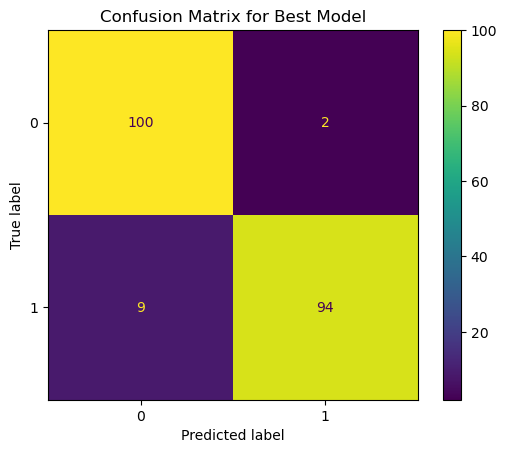

In [46]:
param_grid={
    "classifier__max_depth": [3, 5, 7, 10],
    "classifier__min_samples_split": [2, 5, 10],
    "classifier__min_samples_leaf": [1, 2, 4],
    "classifier__criterion": ["gini", "entropy"]
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='roc_auc', n_jobs=-1,verbose=1)
grid_search.fit(X_train, y_train)
print("Best Parameters:", grid_search.best_params_)

best_pipeline = grid_search.best_estimator_

y_pred_best = best_pipeline.predict(X_test)

y_prob_best=best_pipeline.predict_proba(X_test)[:, 1]

print("Best Model AUC : ", roc_auc_score(y_test, y_prob_best))

plt.figure(figsize=(10, 6))

ConfusionMatrixDisplay.from_estimator(best_pipeline, X_test, y_test)
plt.title("Confusion Matrix for Best Model")
plt.show()

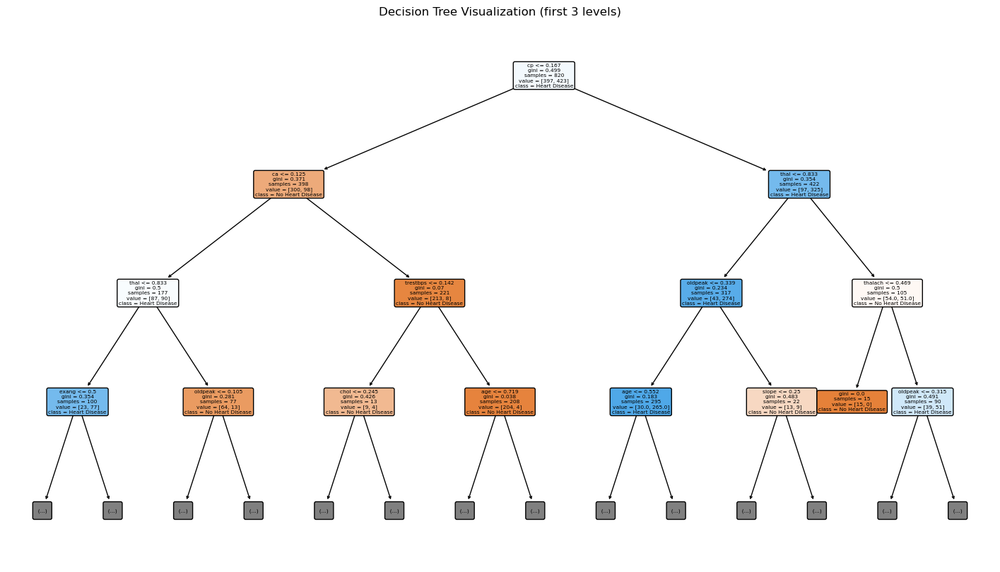

In [37]:
dt=best_pipeline.named_steps['classifier']
plt.figure(figsize=(18, 10))
plot_tree(dt, filled=True, feature_names=X.columns, class_names=['No Heart Disease', 'Heart Disease'],rounded=True,max_depth=3)
plt.title("Decision Tree Visualization (first 3 levels)")
plt.show()

In [47]:
rf_pipeline= Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="mean")),
        ("scaler", MinMaxScaler()),
        ("rf_classifier", RandomForestClassifier(random_state=42))
    ]
)
rf_pipeline

Pipeline(steps=[('imputer', SimpleImputer()), ('scaler', MinMaxScaler()),
                ('rf_classifier', RandomForestClassifier(random_state=42))])

In [48]:
rf_pipeline.fit(X_train, y_train)

Pipeline(steps=[('imputer', SimpleImputer()), ('scaler', MinMaxScaler()),
                ('rf_classifier', RandomForestClassifier(random_state=42))])

In [49]:
param_grid_2={
    "rf_classifier__n_estimators":[50,100,200],
    "rf_classifier__max_depth":[3, 5, 7,None],
    "rf_classifier__min_samples_split":[2, 5, 10],
    "rf_classifier__min_samples_leaf":[1, 2, 4],
    "rf_classifier__criterion":["gini", "entropy"]
}

rf_grid_search = GridSearchCV(rf_pipeline, param_grid_2, cv=5, scoring='roc_auc', n_jobs=-1, verbose=1)
rf_grid_search

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('imputer', SimpleImputer()),
                                       ('scaler', MinMaxScaler()),
                                       ('rf_classifier',
                                        RandomForestClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'rf_classifier__criterion': ['gini', 'entropy'],
                         'rf_classifier__max_depth': [3, 5, 7, None],
                         'rf_classifier__min_samples_leaf': [1, 2, 4],
                         'rf_classifier__min_samples_split': [2, 5, 10],
                         'rf_classifier__n_estimators': [50, 100, 200]},
             scoring='roc_auc', verbose=1)

In [50]:
rf_grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('imputer', SimpleImputer()),
                                       ('scaler', MinMaxScaler()),
                                       ('rf_classifier',
                                        RandomForestClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'rf_classifier__criterion': ['gini', 'entropy'],
                         'rf_classifier__max_depth': [3, 5, 7, None],
                         'rf_classifier__min_samples_leaf': [1, 2, 4],
                         'rf_classifier__min_samples_split': [2, 5, 10],
                         'rf_classifier__n_estimators': [50, 100, 200]},
             scoring='roc_auc', verbose=1)

In [51]:
print("Best Parameters for Random Forest:", rf_grid_search.best_params_)
print('\n')
print("Best AUC for Random Forest:", rf_grid_search.best_score_)

Best Parameters for Random Forest: {'rf_classifier__criterion': 'gini', 'rf_classifier__max_depth': None, 'rf_classifier__min_samples_leaf': 1, 'rf_classifier__min_samples_split': 2, 'rf_classifier__n_estimators': 100}


Best AUC for Random Forest: 0.9962480720136156


Random Forest AUC: 1.0


<Figure size 1000x600 with 0 Axes>

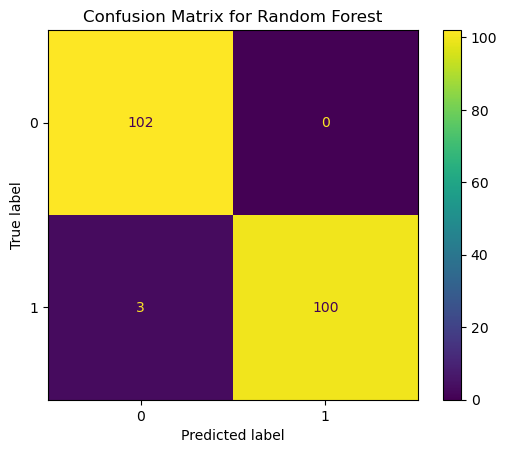

In [52]:
rf_best_pipeline = rf_grid_search.best_estimator_
y_pred_rf = rf_best_pipeline.predict(X_test)
y_prob_rf = rf_best_pipeline.predict_proba(X_test)[:, 1]
print("Random Forest AUC:", roc_auc_score(y_test, y_prob_rf))
plt.figure(figsize=(10, 6))
ConfusionMatrixDisplay.from_estimator(rf_best_pipeline, X_test, y_test)
plt.title("Confusion Matrix for Random Forest")
plt.show()

<Figure size 1000x600 with 0 Axes>

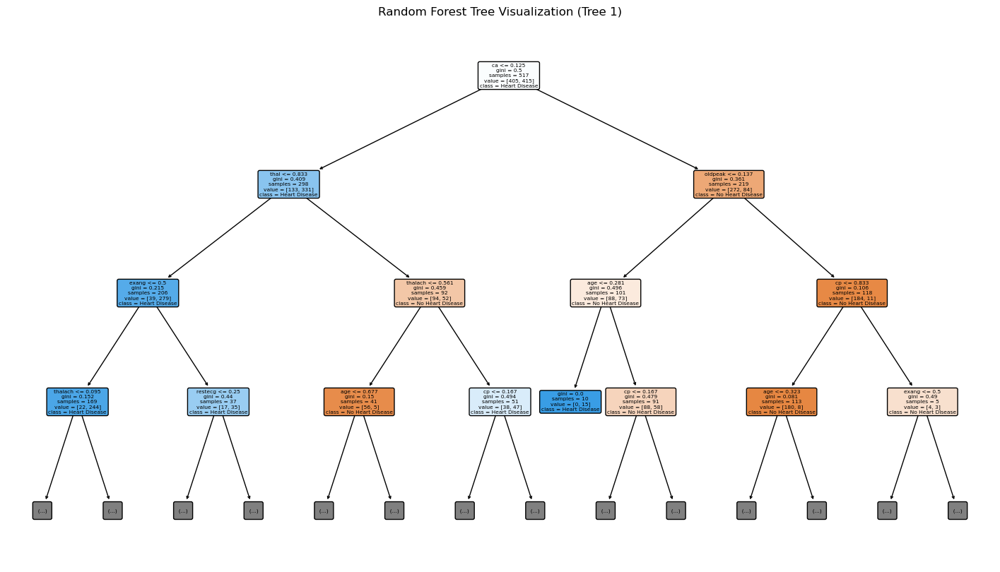

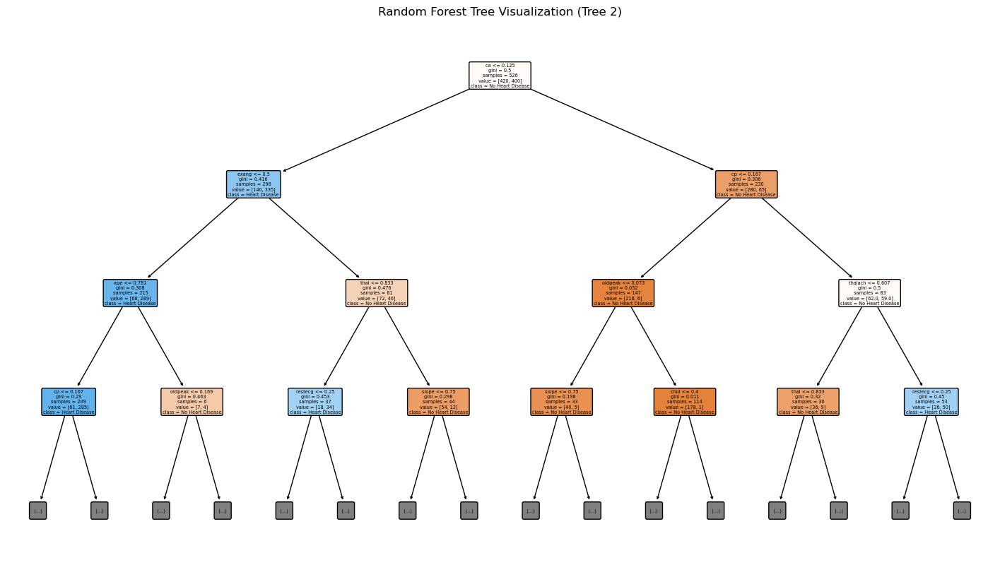

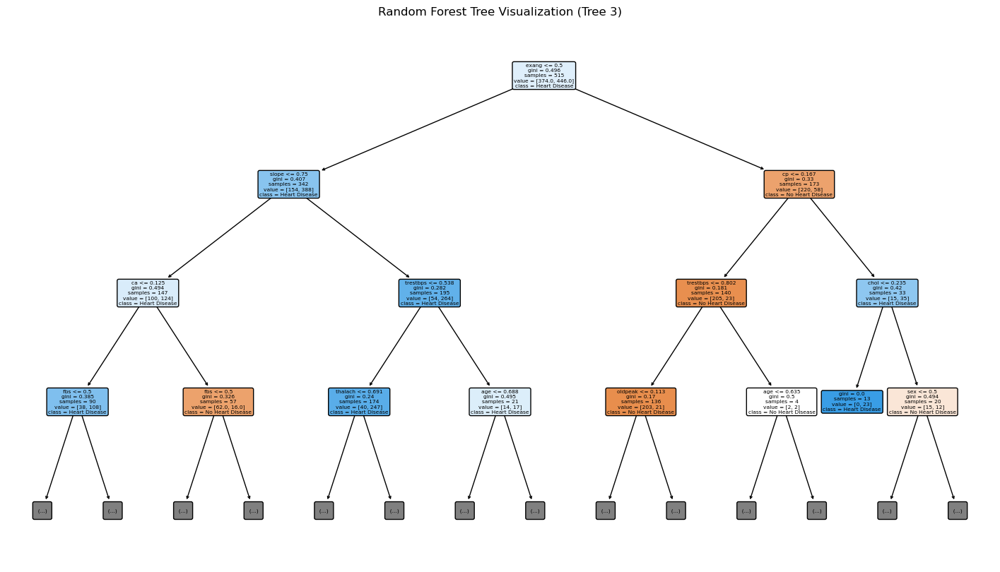

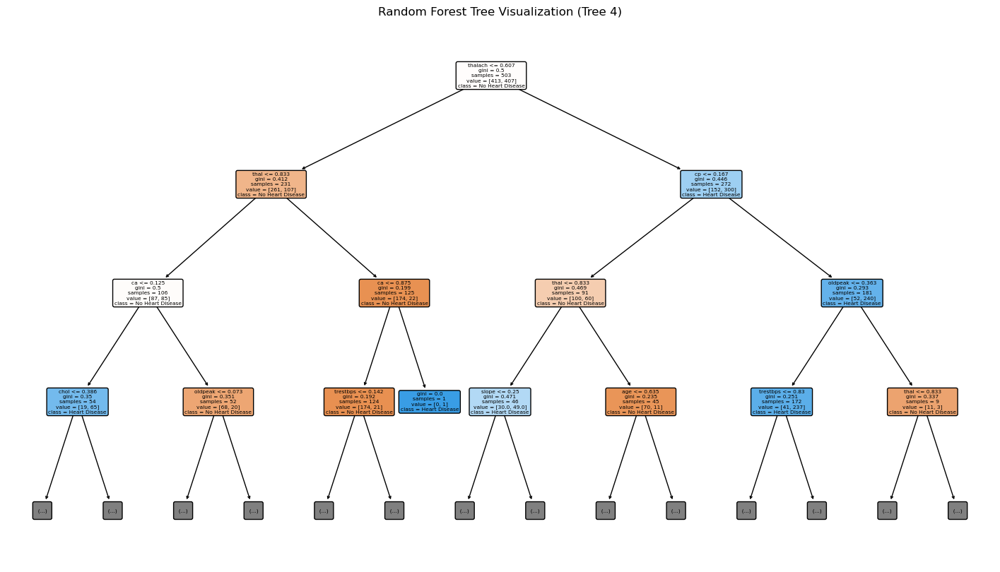

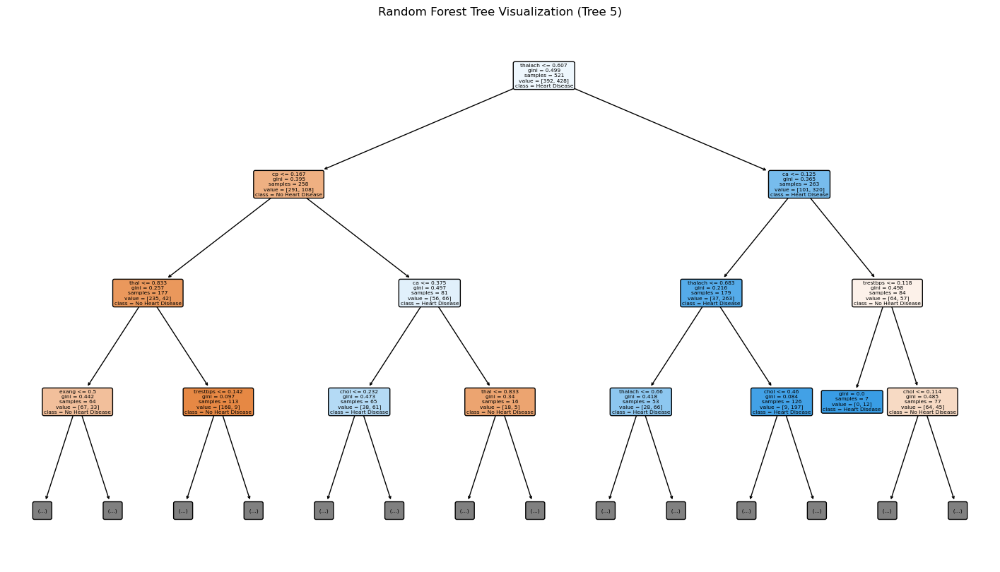

...

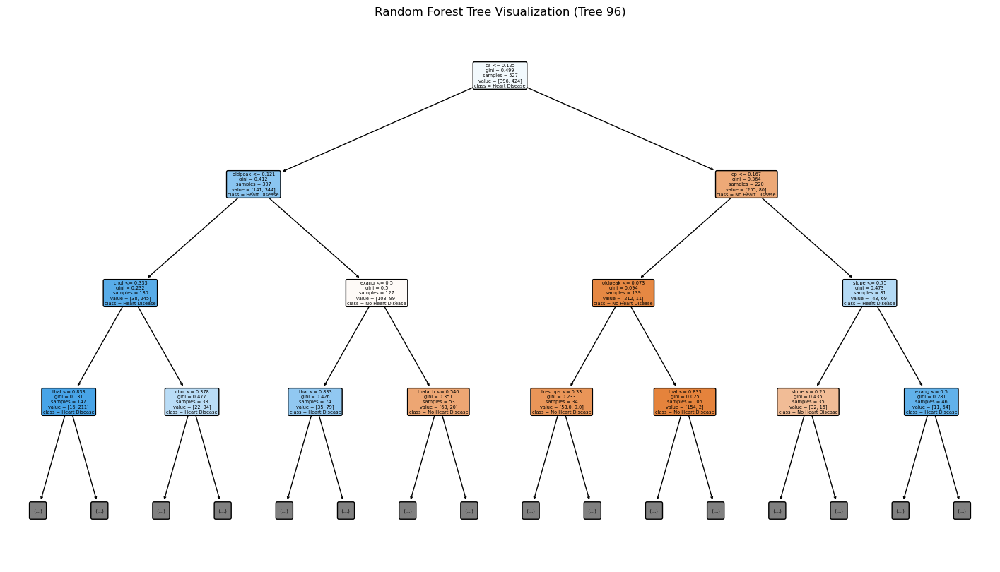

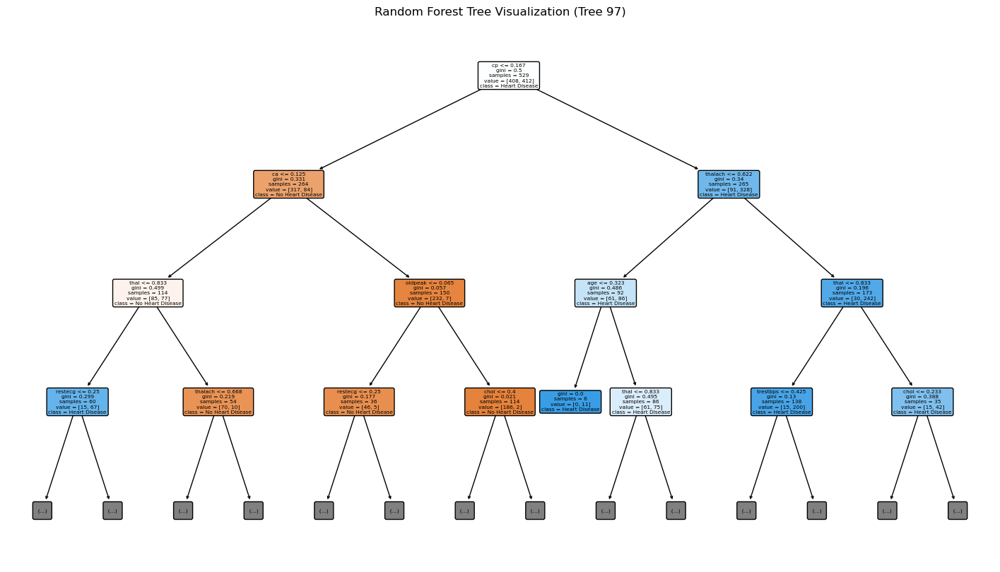

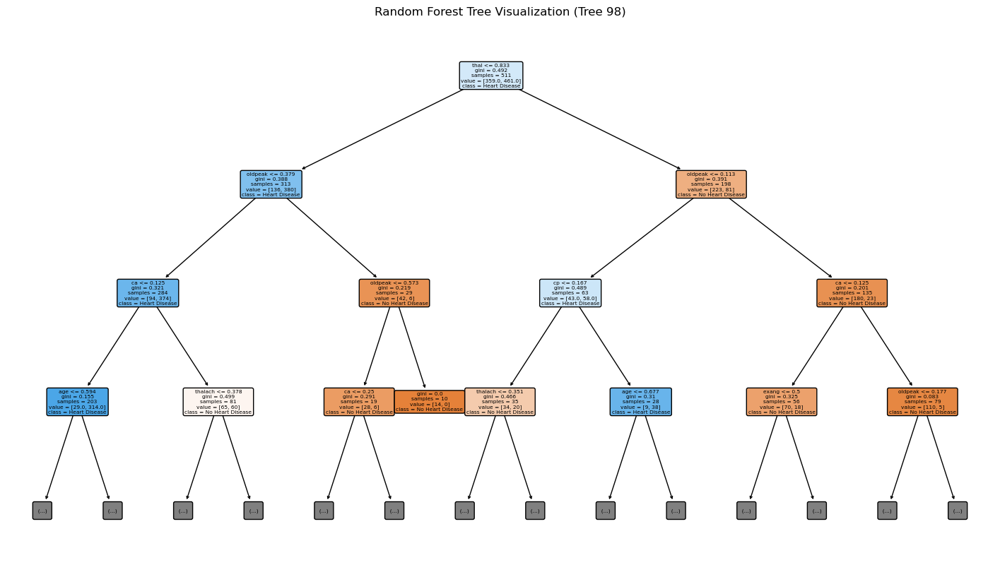

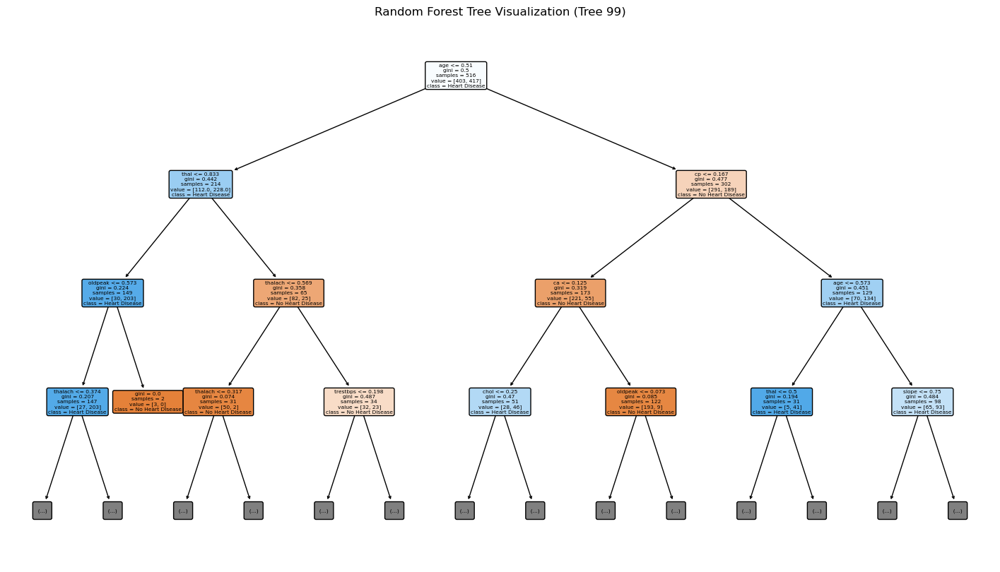

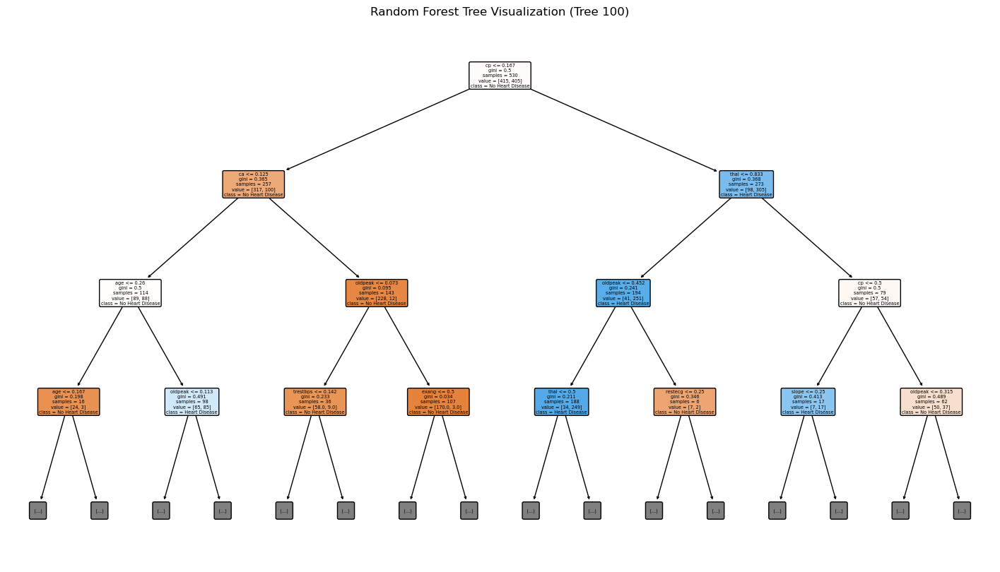

In [54]:
rf_model=rf_best_pipeline.named_steps['rf_classifier']
plt.figure(figsize=(10, 6))

for i,estimator in enumerate(rf_model.estimators_):
    plt.figure(figsize=(18, 10))
    plot_tree(estimator, 
              filled=True, 
              feature_names=X.columns, 
              class_names=['No Heart Disease', 'Heart Disease'], 
              rounded=True, 
              max_depth=3)
    plt.title(f"Random Forest Tree Visualization (Tree {i+1})")
    plt.show()